In [1]:
import anndata
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.decomposition import TruncatedSVD
from scipy import sparse, io
import pybiomart

matplotlib.rcParams.update({'font.size': 12})
%config InlineBackend.figure_format = 'retina'

In [34]:
# from https://www.kallistobus.tools/tutorials/kb_getting_started/python/kb_intro_2_python/

In [122]:
adata = anndata.read('ery_data/counts_unfiltered/adata.h5ad')
adata

AnnData object with n_obs × n_vars = 2129291 × 60623
    var: 'gene_name'

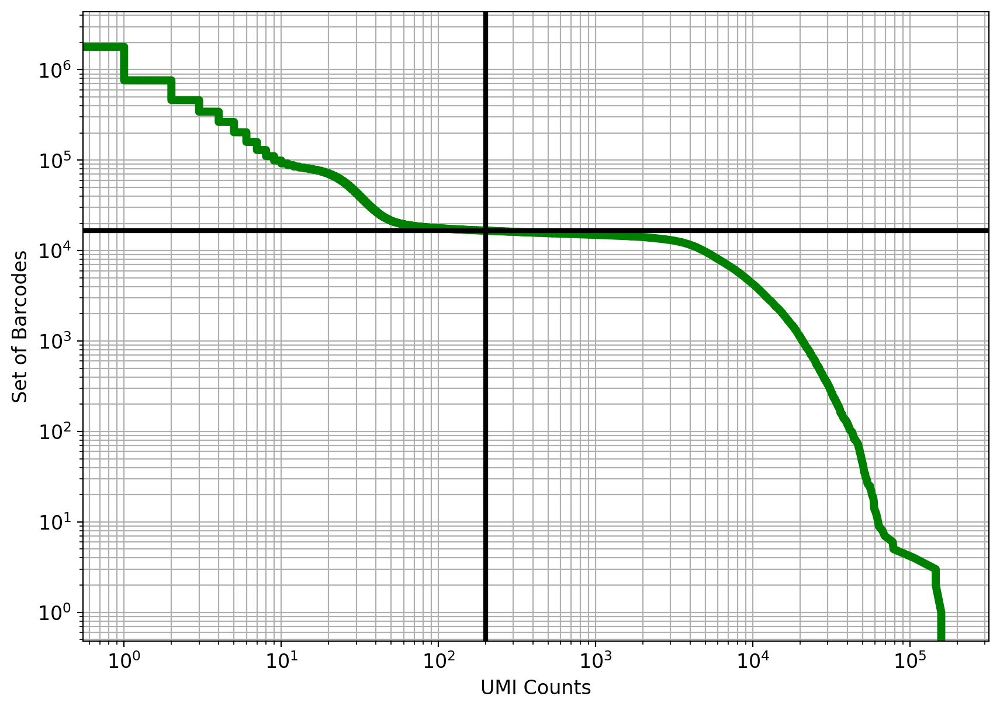

In [123]:
#@title Threshold cells according to knee plot { run: "auto", vertical-output: true }
cutoff =  200#@param {type:"integer"}
knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
cell_set = np.arange(len(knee))
num_cells = cell_set[knee > cutoff][::-1][0]

fig, ax = plt.subplots(figsize=(10, 7))


ax.loglog(knee, cell_set, linewidth=5, color="g")
ax.axvline(x=cutoff, linewidth=3, color="k")


ax.axhline(y=num_cells, linewidth=3, color="k")

ax.set_xlabel("UMI Counts")
ax.set_ylabel("Set of Barcodes")

plt.grid(True, which="both")
plt.show()

In [124]:
print(f"{num_cells:,.0f} cells passed the {cutoff} UMI threshold")

16,620 cells passed the 200 UMI threshold


In [125]:
# Filter the cells according to the threshold determined from the knee plot
sc.pp.filter_cells(adata, min_counts=200)

In [126]:
adata.obs.to_csv("230414_valid_cells.csv")

In [127]:
# name each gene by ENSG so we can get rid of the mito ones
adata.var["ensg"] = [x.split('.')[0] for x in list(adata.var["gene_name"].keys())]
adata.var_names = list(adata.var["ensg"])
adata.var

,gene_name,ensg
ENSG00000223972,DDX11L1,ENSG00000223972
ENSG00000227232,WASH7P,ENSG00000227232
ENSG00000278267,MIR6859-1,ENSG00000278267
ENSG00000243485,MIR1302-2HG,ENSG00000243485
ENSG00000284332,MIR1302-2,ENSG00000284332
...,...,...
ENSG00000271254,AC240274.1,ENSG00000271254
ENSG00000275405,U1,ENSG00000275405
ENSG00000275987,U1,ENSG00000275987
ENSG00000277475,AC213203.2,ENSG00000277475


In [128]:
mito_ensembl_ids = sc.queries.mitochondrial_genes("hsapiens", attrname="ensembl_gene_id")

In [129]:
# removing cells with high mito content
mito_genes = mito_ensembl_ids["ensembl_gene_id"].values
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

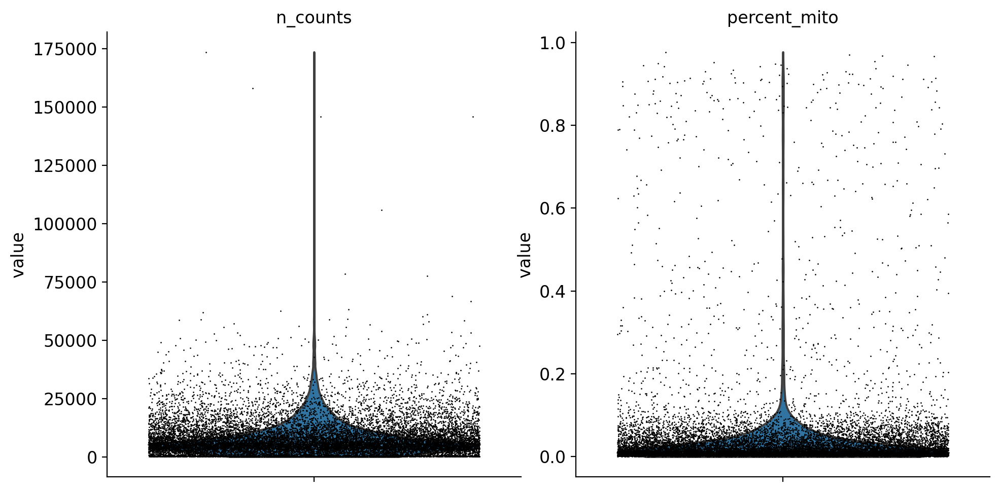

In [130]:
sc.pl.violin(adata, ['n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

In [131]:
# filter cells by mito content
adata = adata[adata.obs['percent_mito'] < 0.1]

In [132]:
# normalize and log
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

/home/briando/data/software/miniconda3/envs/scrnaseqv2/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


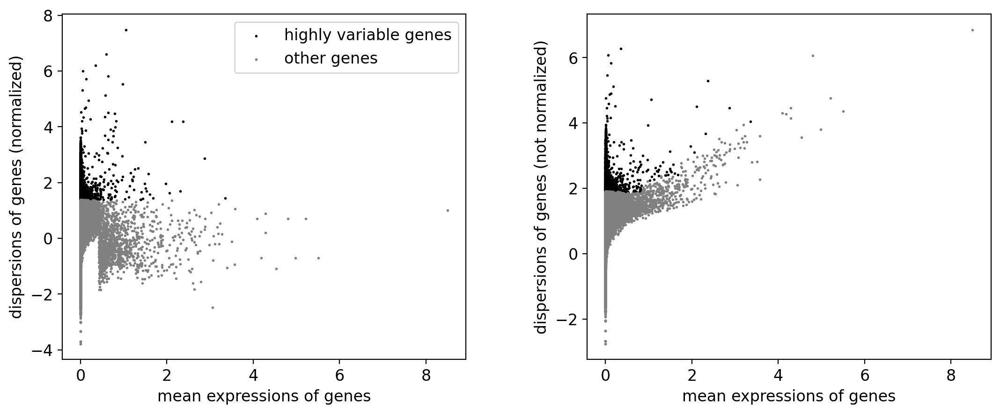

In [133]:
# flavor="cell_ranger" is consistent with Seurat and flavor="seurat" is not consistent with Seurat
sc.pp.highly_variable_genes(adata, min_mean=0.01, max_mean=8, min_disp=1, n_top_genes=3000, n_bins=20, flavor="seurat")
sc.pl.highly_variable_genes(adata)

In [134]:
# PCA and louvain
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True, n_comps=10)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=10, knn=True)
sc.tl.louvain(adata)

/home/briando/data/software/miniconda3/envs/scrnaseqv2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


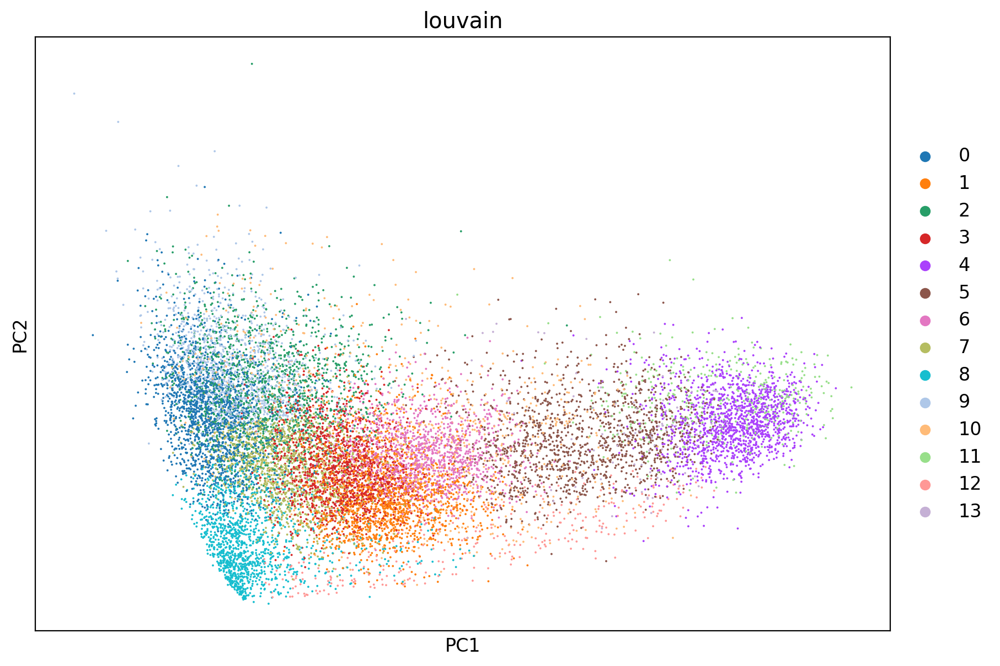

In [135]:
# Perform PCA and plot the projection to the first two dimensions, with points colored according to the Louvain clusters.
fig, ax = plt.subplots(figsize=(10, 7))
sc.pl.pca(adata, color='louvain', ax=ax)

In [136]:
%%time
# Visualize cells with t-SNE. The n_pcs parameter sets the number of principal components to project to prior to 
# performing t-SNE
sc.tl.umap(adata)

CPU times: user 35.1 s, sys: 6.86 s, total: 41.9 s
Wall time: 32.8 s


/home/briando/data/software/miniconda3/envs/scrnaseqv2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


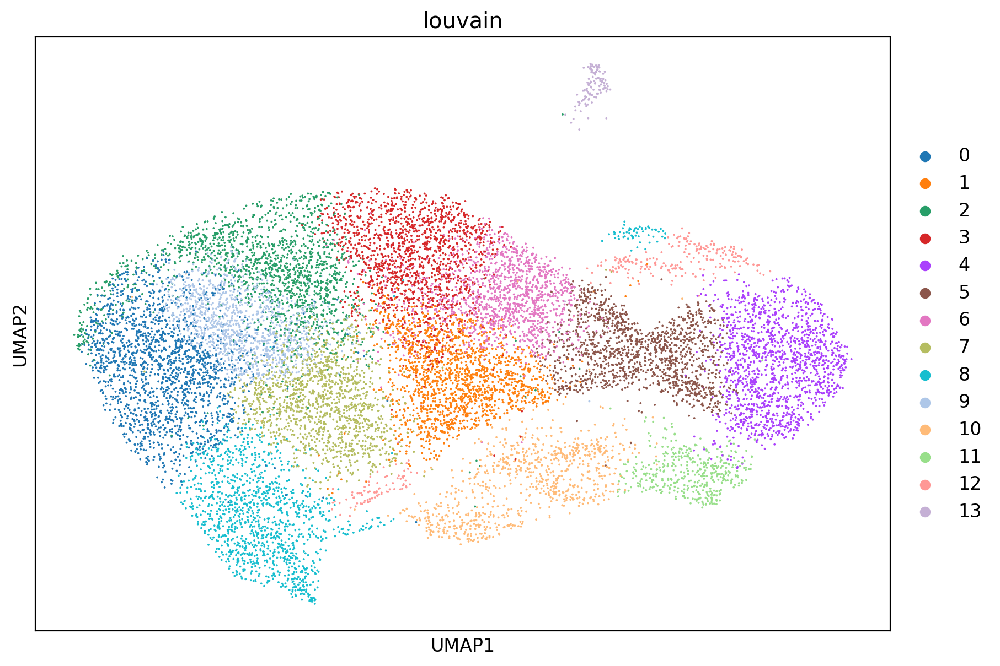

In [137]:
fig, ax = plt.subplots(figsize=(10, 7))
sc.pl.umap(adata, color='louvain', ax=ax)

In [140]:
adata.var_names = list(adata.var["gene_name"])

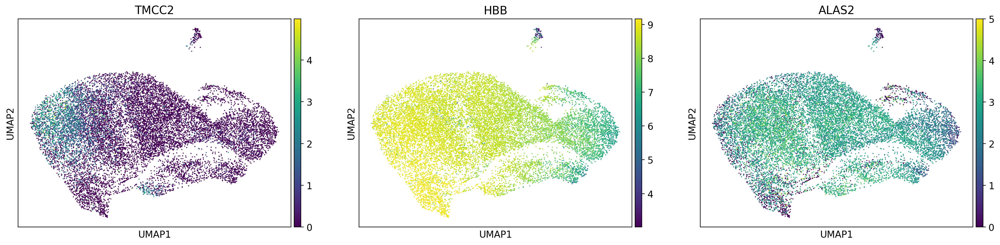

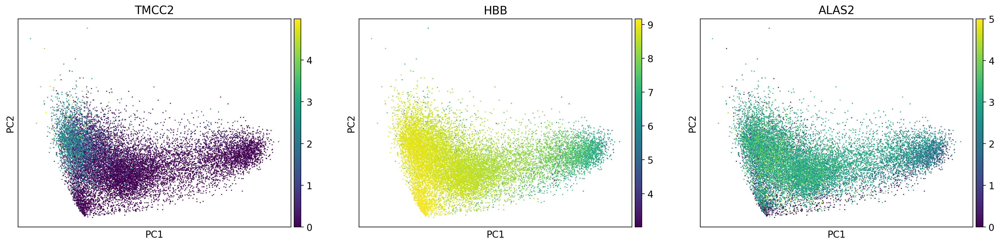

In [141]:
genes = ["TMCC2", "HBB", "ALAS2"]
sc.pl.umap(adata, color=genes)
sc.pl.pca(adata, color=genes)

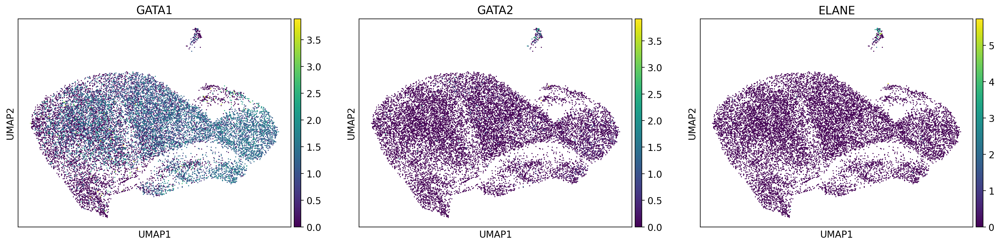

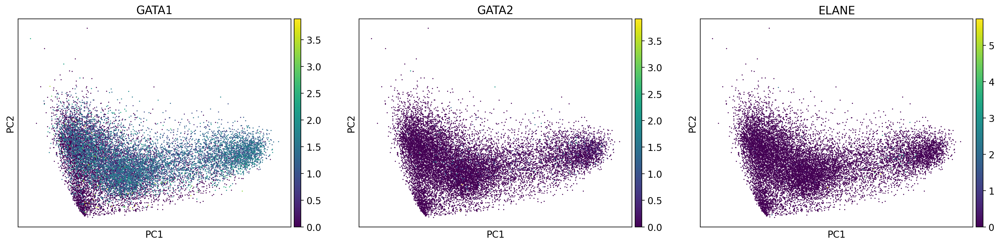

In [142]:
genes = ["GATA1", "GATA2", "ELANE"]
sc.pl.umap(adata, color=genes)
sc.pl.pca(adata, color=genes)

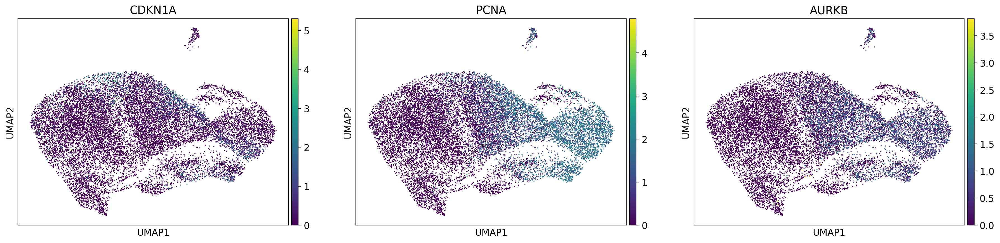

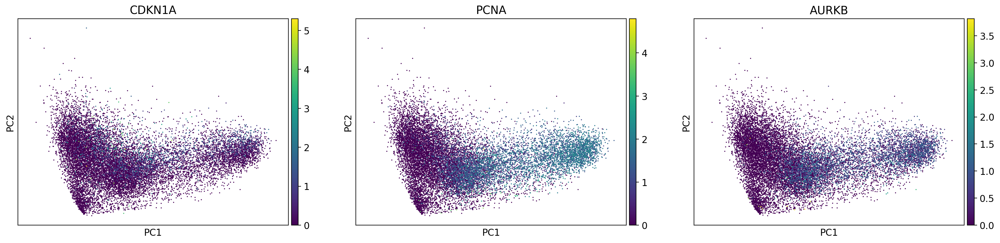

In [143]:
genes = ["CDKN1A", "PCNA", "AURKB"]
sc.pl.umap(adata, color=genes)
sc.pl.pca(adata, color=genes)